In [1]:
import os
import operator

import numpy as np
import pandas as pd
pd.options.display.max_colwidth = 200
import polars as pl

import seaborn as sns
import matplotlib.pyplot as plt

from clickhouse_driver import Client

client = Client('localhost', database="thesisnumproxyconnectionsdb")

In [2]:
%%time 

exp_data_sql = """
SELECT
	ex.*
FROM
	experiment ex
"""
exp_df = client.query_dataframe(exp_data_sql)

print(f"num_proxy_connections: {sorted(exp_df['num_proxy_connections'].unique())}")
print(f"run_attacker: {exp_df['run_attacker'].unique()}")

print(len(exp_df.exp_id.unique().tolist()))
print("\n".join(exp_df.exp_id.unique().tolist()))
print()
exp_df

num_proxy_connections: [1, 3, 5, 7, 10, 30, 50, 70, 90, 110, 130, 150, 170, 190, 210]
run_attacker: [ True]
30
thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https
thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_dtls_https
thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_3proxyconns_coap_https
thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_3proxyconns_dtls_https
thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_5proxyconns_coap_https
thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_5proxyconns_dtls_https
thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_7proxyconns_coap_https
thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_7proxyconns_dtls_https
thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_10proxyconns_coap_https__140sec_proxy__30sec_

,exp_id,attacker_rate,server_connections,max_keep_alive_requests,num_clients,num_trials,origin_server_duration,attacker_duration,receiver_duration,proxy_duration,...,topology_name,num_proxy_connections,request_timeout,max_retries,keep_alive_duration,request_retry_interval,reuse_connections,run_proxy_with_dtls,run_proxy_with_https,run_attacker
0,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,100mbps,256,0,8,5,140,30,140,140,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
1,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_dtls_https,100mbps,256,0,8,5,140,30,140,140,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,True,True,True
2,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_3proxyconns_coap_https,100mbps,256,0,8,5,140,30,140,140,...,thesis_cloud_proxy_and_internet_attacker,3,5,4,150,1,True,False,True,True
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_3proxyconns_dtls_https,100mbps,256,0,8,5,140,30,140,140,...,thesis_cloud_proxy_and_internet_attacker,3,5,4,150,1,True,True,True,True
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_5proxyconns_coap_https,100mbps,256,0,8,5,140,30,140,140,...,thesis_cloud_proxy_and_internet_attacker,5,5,4,150,1,True,False,True,True
5,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_5proxyconns_dtls_https,100mbps,256,0,8,5,140,30,140,140,...,thesis_cloud_proxy_and_internet_attacker,5,5,4,150,1,True,True,True,True
6,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_7proxyconns_coap_https,100mbps,256,0,8,5,140,30,140,140,...,thesis_cloud_proxy_and_internet_attacker,7,5,4,150,1,True,False,True,True
7,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_7proxyconns_dtls_https,100mbps,256,0,8,5,140,30,140,140,...,thesis_cloud_proxy_and_internet_attacker,7,5,4,150,1,True,True,True,True
8,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_10proxyconns_coap_https__140sec_proxy__30sec_attacker__120sec_client,100mbps,256,0,8,5,140,30,140,140,...,thesis_cloud_proxy_and_internet_attacker,10,5,2,5,1,True,False,True,True
9,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_10proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,100mbps,256,0,8,5,140,30,140,140,...,thesis_cloud_proxy_and_internet_attacker,10,5,2,5,1,True,True,True,True


In [3]:
%%time 

fetch_metadata_sql = """
SELECT
	n.node_name,
	dn.dnid,
	dn.node_id,
  dn.exp_id
FROM 
	deployed_node dn
	JOIN node n ON n.node_id = dn.node_id
"""

metadata_df = client.query_dataframe(fetch_metadata_sql)

dnid_map_node_name = dict()
dnid_map_exp_id = dict()
node_id_map_node_name = dict()

for record in metadata_df.to_dict(orient="records"):
  dnid = record["dnid"]
  node_id = record["node_id"]
  node_name = record["node_name"]
  exp_id = record["exp_id"]
  
  assert dnid not in dnid_map_node_name
  dnid_map_node_name[dnid] = node_name
  dnid_map_exp_id[dnid] = exp_id
  
  if node_id in node_id_map_node_name:
    assert node_id_map_node_name[node_id] == node_name
  else:
    node_id_map_node_name[node_id] = node_name
  
client_dnids = set(dnid for dnid, node_name in dnid_map_node_name.items() if node_name.startswith("client"))
attacker_dnids = set(dnid for dnid, node_name in dnid_map_node_name.items() if node_name.startswith("attacker"))
proxy_dnids = set(dnid for dnid, node_name in dnid_map_node_name.items() if node_name.startswith("proxy"))
originserver_dnids = set(dnid for dnid, node_name in dnid_map_node_name.items() if node_name.startswith("originserver"))

attacker_node_ids = set(node_id for node_id, node_name in node_id_map_node_name.items() if node_name.startswith("attacker"))
client_node_ids = set(node_id for node_id, node_name in node_id_map_node_name.items() if node_name.startswith("client"))
originserver_node_ids = set(node_id for node_id, node_name in node_id_map_node_name.items() if node_name.startswith("originserver"))

print(f"{client_dnids=}")
print(f"{attacker_dnids=}")
print(f"{proxy_dnids=}")
print(f"{originserver_dnids=}")
print(f"{attacker_node_ids=}")
print(f"{client_node_ids=}")
print(f"{originserver_node_ids=}")

client_dnids={2, 3, 4, 5, 6, 7, 8, 9, 14, 15, 16, 17, 18, 19, 20, 21, 26, 27, 28, 29, 30, 31, 32, 33, 38, 39, 40, 41, 42, 43, 44, 45, 50, 51, 52, 53, 54, 55, 56, 57, 62, 63, 64, 65, 66, 67, 68, 69, 74, 75, 76, 77, 78, 79, 80, 81, 86, 87, 88, 89, 90, 91, 92, 93, 98, 99, 100, 101, 102, 103, 104, 105, 110, 111, 112, 113, 114, 115, 116, 117, 122, 123, 124, 125, 126, 127, 128, 129, 134, 135, 136, 137, 138, 139, 140, 141, 146, 147, 148, 149, 150, 151, 152, 153, 158, 159, 160, 161, 162, 163, 164, 165, 170, 171, 172, 173, 174, 175, 176, 177, 182, 183, 184, 185, 186, 187, 188, 189, 194, 195, 196, 197, 198, 199, 200, 201, 206, 207, 208, 209, 210, 211, 212, 213, 218, 219, 220, 221, 222, 223, 224, 225, 230, 231, 232, 233, 234, 235, 236, 237, 242, 243, 244, 245, 246, 247, 248, 249, 254, 255, 256, 257, 258, 259, 260, 261, 266, 267, 268, 269, 270, 271, 272, 273, 278, 279, 280, 281, 282, 283, 284, 285, 290, 291, 292, 293, 294, 295, 296, 297, 302, 303, 304, 305, 306, 307, 308, 309, 314, 315, 316, 317, 

In [4]:
client_messages_sql = f"""
WITH client_sends AS (
  SELECT
    dn.exp_id AS exp_id,
    e.observe_timestamp AS observe_timestamp,
    e.trial AS trial,
    e.observer_id AS observer_id,
    e.message_marker AS message_marker,
    cm.coap_retransmitted AS coap_retransmitted
  FROM
    event e
    JOIN message m ON m.message_id = e.message_id
    JOIN coap_message cm ON cm.cmci = m.coap_message
    JOIN deployed_node dn ON dn.dnid = e.observer_id
  WHERE
    e.observer_id IN ({','.join(map(str, client_dnids))})   -- client dnids
    AND m.src_id IN ({','.join(map(str, client_node_ids))}) -- clients are senders (node ID)
), 

client_recvs AS (
  SELECT
    e.observe_timestamp AS observe_timestamp,
    e.trial AS trial,
    e.observer_id AS observer_id,
    e.message_marker AS message_marker,
    cm.coap_code AS response_code
  FROM
    event e
    JOIN message m ON m.message_id = e.message_id
    JOIN coap_message cm ON cm.cmci = m.coap_message
  WHERE
    e.observer_id IN ({','.join(map(str, client_dnids))})   -- client dnids
    AND m.dst_id IN ({','.join(map(str, client_node_ids))}) -- clients are receivers (node ID)
)

SELECT
  client_sends.exp_id AS exp_id,
  client_sends.trial AS trial,
  client_sends.observer_id AS observer_id,
  client_sends.message_marker AS message_marker,
  groupArray(client_recvs.response_code)[1] AS response_code,
  MIN(client_sends.observe_timestamp) AS send_time_sec,
  MIN(client_recvs.observe_timestamp) AS recv_time_sec,
  MIN(client_sends.observe_timestamp) AS first_send_time_sec,
  MAX(client_sends.observe_timestamp) AS last_send_time_sec,
  MIN(client_recvs.observe_timestamp) AS first_recv_time_sec,
  MAX(client_recvs.observe_timestamp) AS last_recv_time_sec,
  1e3 * (MIN(client_recvs.observe_timestamp) - MIN(client_sends.observe_timestamp)) AS rtt_ms_first_transmission,
  1e3 * (MIN(client_recvs.observe_timestamp) - MAX(client_sends.observe_timestamp)) AS rtt_ms_last_transmission,
  COUNT(client_sends.observe_timestamp) AS num_send_observations,
  COUNT(client_recvs.observe_timestamp) AS num_recv_observations,
  SUM(CASE WHEN client_sends.coap_retransmitted = true THEN 1 ELSE 0 END) AS num_retransmissions
FROM client_sends
  LEFT JOIN client_recvs USING (trial, observer_id, message_marker)
GROUP BY 
  exp_id, trial, observer_id, message_marker
ORDER BY
  exp_id, trial, observer_id, message_marker
"""

message_rtt_df = client.query_dataframe(client_messages_sql)
message_rtt_df.observer_id.replace(dnid_map_node_name, inplace=True)

message_rtt_df["successful_message"] = False
message_rtt_df.loc[(message_rtt_df["response_code"] == "content"), "successful_message"] = True

print(message_rtt_df["response_code"].unique())

message_rtt_df = message_rtt_df.merge(exp_df, on="exp_id", how="left")

# Due to left join, we need to eliminate lines that
# have negative RTT, so we NaN them.
message_rtt_df.loc[
  (message_rtt_df["rtt_ms_first_transmission"] < 0)
  | (message_rtt_df["rtt_ms_last_transmission"] < 0)
  ,
  ["rtt_ms_first_transmission", "rtt_ms_last_transmission"]
] = np.nan

message_rtt_df

['content' 'bad_gateway' '']


,exp_id,trial,observer_id,message_marker,response_code,send_time_sec,recv_time_sec,first_send_time_sec,last_send_time_sec,first_recv_time_sec,...,topology_name,num_proxy_connections,request_timeout,max_retries,keep_alive_duration,request_retry_interval,reuse_connections,run_proxy_with_dtls,run_proxy_with_https,run_attacker
0,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,client1,1,content,0.000000,0.343467,0.000000,0.000000,0.343467,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
1,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,client1,2,content,0.359698,0.419168,0.359698,0.359698,0.419168,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
2,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,client1,3,content,0.421618,0.480902,0.421618,0.421618,0.480902,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,client1,4,content,0.483229,0.539894,0.483229,0.483229,0.539894,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,client1,5,content,0.541968,0.597902,0.541968,0.541968,0.597902,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1837688,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,client8,696409,content,125.716071,125.768788,125.716071,125.716071,125.768788,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True
1837689,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,client8,696410,content,125.769517,125.822192,125.769517,125.769517,125.822192,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True
1837690,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,client8,696411,content,125.822907,125.875557,125.822907,125.822907,125.875557,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True
1837691,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,client8,696412,content,125.876323,125.928985,125.876323,125.876323,125.928985,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True


In [5]:
%%time

client_sends_sql = f"""
WITH client_sends AS (
  SELECT
    dn.exp_id AS exp_id,
    e.observe_timestamp AS observe_timestamp,
    e.trial AS trial,
    e.observer_id AS observer_id,
    e.message_marker AS message_marker,
    cm.coap_retransmitted AS coap_retransmitted
  FROM
    event e
    JOIN message m ON m.message_id = e.message_id
    JOIN coap_message cm ON cm.cmci = m.coap_message
    JOIN deployed_node dn ON dn.dnid = e.observer_id
  WHERE
    e.observer_id IN ({','.join(map(str, client_dnids))})   -- client dnids
    AND m.src_id IN ({','.join(map(str, client_node_ids))}) -- clients are senders (node ID)
)

SELECT * FROM client_sends
ORDER BY exp_id, trial, observer_id, message_marker
"""

client_sends_df = client.query_dataframe(client_sends_sql)
client_sends_df.observer_id.replace(dnid_map_node_name, inplace=True)

client_sends_df

CPU times: user 21.5 s, sys: 2.66 s, total: 24.2 s
Wall time: 25.2 s


,exp_id,observe_timestamp,trial,observer_id,message_marker,coap_retransmitted
0,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,0.000000,1,client1,1,False
1,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,0.359698,1,client1,2,False
2,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,0.421618,1,client1,3,False
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,0.483229,1,client1,4,False
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,0.541968,1,client1,5,False
...,...,...,...,...,...,...
1845605,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,125.716071,5,client8,696409,False
1845606,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,125.769517,5,client8,696410,False
1845607,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,125.822907,5,client8,696411,False
1845608,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,125.876323,5,client8,696412,False


In [8]:
%%time

client_recvs_sql = f"""
WITH client_recvs AS (
  SELECT
    dn.exp_id AS exp_id,
    e.observe_timestamp AS observe_timestamp,
    e.trial AS trial,
    e.observer_id AS observer_id,
    e.message_marker AS message_marker,
    cm.coap_code AS response_code
  FROM
    event e
    JOIN message m ON m.message_id = e.message_id
    JOIN coap_message cm ON cm.cmci = m.coap_message
    JOIN deployed_node dn ON dn.dnid = e.observer_id
  WHERE
    e.observer_id IN ({','.join(map(str, client_dnids))})   -- client dnids
    AND m.dst_id IN ({','.join(map(str, client_node_ids))}) -- clients are receivers (node ID)
)

SELECT * FROM client_recvs
ORDER BY exp_id, trial, observer_id, message_marker
"""

client_recvs_df = client.query_dataframe(client_recvs_sql)
client_recvs_df.observer_id.replace(dnid_map_node_name, inplace=True)

client_recvs_df["successful_message"] = False
client_recvs_df.loc[(client_recvs_df["response_code"] == "content"), "successful_message"] = True

print(client_recvs_df["response_code"].unique())

client_recvs_df

['content' 'bad_gateway']
CPU times: user 21.9 s, sys: 4.21 s, total: 26.1 s
Wall time: 27.1 s


,exp_id,observe_timestamp,trial,observer_id,message_marker,response_code,successful_message
0,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,0.343467,1,client1,1,content,True
1,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,0.419168,1,client1,2,content,True
2,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,0.480902,1,client1,3,content,True
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,0.539894,1,client1,4,content,True
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,0.597902,1,client1,5,content,True
...,...,...,...,...,...,...,...
1836543,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,125.715363,5,client8,696408,content,True
1836544,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,125.768788,5,client8,696409,content,True
1836545,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,125.822192,5,client8,696410,content,True
1836546,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,125.875557,5,client8,696411,content,True


In [9]:
%%time

metric_usage_sql = f"""
SELECT
	dn.exp_id,
	nm.trial,
	nm.observer_id,
	nm.metric_type,
	AVG(nm.metric_value) AS avg_value,
	MIN(nm.metric_value) AS min_value,
	MAX(nm.metric_value) AS max_value
FROM
	node_metric nm
	JOIN deployed_node dn ON dn.dnid = nm.observer_id
GROUP BY
	dn.exp_id, nm.trial, nm.observer_id, nm.metric_type
ORDER BY
	dn.exp_id, nm.trial, nm.metric_type, nm.observer_id
"""

metric_df = client.query_dataframe(metric_usage_sql)

metric_df.observer_id.replace(dnid_map_node_name, inplace=True)

metric_df = metric_df.merge(exp_df, on="exp_id", how="left")

metric_df

CPU times: user 54.1 ms, sys: 1.09 ms, total: 55.2 ms
Wall time: 163 ms


,exp_id,trial,observer_id,metric_type,avg_value,min_value,max_value,attacker_rate,server_connections,max_keep_alive_requests,...,topology_name,num_proxy_connections,request_timeout,max_retries,keep_alive_duration,request_retry_interval,reuse_connections,run_proxy_with_dtls,run_proxy_with_https,run_attacker
0,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,originserver,cpu_utilization,1.193571,0.4,9.5,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
1,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,proxy,cpu_utilization,13.207857,0.5,79.9,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
2,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,originserver,memory_utilization,269.396694,257.0,272.0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,proxy,memory_utilization,3461.143095,252.0,5686.0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,2,originserver,cpu_utilization,1.154286,0.4,9.4,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,4,proxy,memory_utilization,3834.353923,253.0,6369.0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True
596,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,originserver,cpu_utilization,8.295000,0.3,36.8,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True
597,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,proxy,cpu_utilization,17.153571,0.5,91.7,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True
598,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,originserver,memory_utilization,293.013289,262.0,346.0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True


In [10]:
%%time

client_rps_df = (
  message_rtt_df
  .groupby(by=["exp_id", "trial", "observer_id"])
  .aggregate(
    num_messages=("successful_message", "count"),
    num_successful_messages=("successful_message", "sum"),
    mean_rps=("successful_message", "sum"),
    max_num_retransmissions=("num_retransmissions", "max"),
    total_num_retransmissions=("num_retransmissions", "sum"),
    stddev_rtt_ms=("rtt_ms_first_transmission", "std"),
    min_rtt_ms=("rtt_ms_first_transmission", "min"),
    median_rtt_ms=("rtt_ms_first_transmission", "median"),
    mean_rtt_ms=("rtt_ms_first_transmission", "mean"),
    max_rtt_ms=("rtt_ms_first_transmission", "max"),
    rtt_ms_p0=("rtt_ms_first_transmission", lambda s : pd.Series.quantile(s, q=0.00)),
    rtt_ms_p25=("rtt_ms_first_transmission", lambda s : pd.Series.quantile(s, q=0.25)),
    rtt_ms_p50=("rtt_ms_first_transmission", lambda s : pd.Series.quantile(s, q=0.50)),
    rtt_ms_p75=("rtt_ms_first_transmission", lambda s : pd.Series.quantile(s, q=0.75)),
    rtt_ms_p90=("rtt_ms_first_transmission", lambda s : pd.Series.quantile(s, q=0.90)),
    rtt_ms_p99=("rtt_ms_first_transmission", lambda s : pd.Series.quantile(s, q=0.99)),
    rtt_ms_p100=("rtt_ms_first_transmission", lambda s : pd.Series.quantile(s, q=1.00)),
    first_active_time=("first_send_time_sec", "min"),
    last_active_time=("last_recv_time_sec", "max"),
  )
  .reset_index()
)
assert client_rps_df["min_rtt_ms"].eq(client_rps_df["rtt_ms_p0"]).all()
assert client_rps_df["median_rtt_ms"].eq(client_rps_df["rtt_ms_p50"]).all()
assert client_rps_df["max_rtt_ms"].eq(client_rps_df["rtt_ms_p100"]).all()

client_rps_df["num_failed_messages"] = client_rps_df["num_messages"] - client_rps_df["num_successful_messages"]
client_rps_df["average_rps"] = client_rps_df["num_successful_messages"] / (client_rps_df["last_active_time"] - client_rps_df["first_active_time"])

client_rps_df = client_rps_df.merge(exp_df, on="exp_id")
bool_col_replacement = {
  "run_proxy_with_dtls": {True: "dtls", False: "coap"},
  "run_proxy_with_https": {True: "https", False: "http"},
  "reuse_connections": {True: "reuse-connections", False: "no-connection-reuse"},
  "run_attacker": {True: "attacker", False: "no-attacker"},
}
client_rps_df.replace(bool_col_replacement, inplace=True)

client_rps_df["mean_rps"] /= client_rps_df["client_duration"]

client_rps_df[["exp_id", "trial", "observer_id", "mean_rps"]]

client_rps_df

CPU times: user 8.26 s, sys: 40.7 ms, total: 8.3 s
Wall time: 8.3 s


,exp_id,trial,observer_id,num_messages,num_successful_messages,mean_rps,max_num_retransmissions,total_num_retransmissions,stddev_rtt_ms,min_rtt_ms,...,topology_name,num_proxy_connections,request_timeout,max_retries,keep_alive_duration,request_retry_interval,reuse_connections,run_proxy_with_dtls,run_proxy_with_https,run_attacker
0,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,client1,961,954,7.950000,2,7,435.641562,54.063082,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,reuse-connections,coap,https,attacker
1,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,client2,959,953,7.941667,2,8,432.073531,53.923130,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,reuse-connections,coap,https,attacker
2,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,client3,957,950,7.916667,2,7,453.320769,53.842068,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,reuse-connections,coap,https,attacker
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,client4,955,949,7.908333,2,7,467.512099,53.938866,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,reuse-connections,coap,https,attacker
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,client5,956,950,7.916667,2,8,463.294291,52.661896,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,reuse-connections,coap,https,attacker
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,client4,1567,1563,13.025000,1,6,345.246076,51.388025,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,reuse-connections,dtls,https,attacker
1196,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,client5,1572,1567,13.058333,1,6,342.359557,51.492929,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,reuse-connections,dtls,https,attacker
1197,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,client6,1575,1572,13.100000,1,7,327.183313,51.460981,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,reuse-connections,dtls,https,attacker
1198,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,client7,1574,1571,13.091667,2,6,430.972222,51.585913,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,reuse-connections,dtls,https,attacker


In [11]:
### At this point, we generate figures for the paper

plt.rcParams['figure.dpi']  = 300
plt.rcParams['savefig.dpi'] = 300

plt.rcParams['font.size']        = '18'
plt.rcParams['lines.linewidth']  = 3
plt.rcParams['lines.markersize'] = 9

value_map_replacement = {
  "run_proxy_with_dtls": {
    "coap": "CoAP",
    False: "CoAP",
    "dtls": "CoAPS",
    True: "CoAPS",
  },
  "reuse_connections": {
    "reuse-connections": "Reuse Connections",
    True: "Reuse Connections",
    "no-connection-reuse": "No Connection Reuse",
    False: "No Connection Reuse",
  },
  "run_attacker": {
    "attacker": "With Attacker",
    True: "With Attacker",
    "no-attacker": "Without Attacker",
    False: "Without Attacker",
  },
  "response_code": {
    "bad_gateway": "Bad Gateway",
    "content": "Content",
  },
}

client_rps_df.replace({
  "run_proxy_with_dtls": {
    "coap": "CoAP",
    "dtls": "CoAPS",
  }
}, inplace=True)

metric_df.replace({
  "run_proxy_with_dtls": {
    False: "CoAP",
    True : "CoAPS",
  }
}, inplace=True)

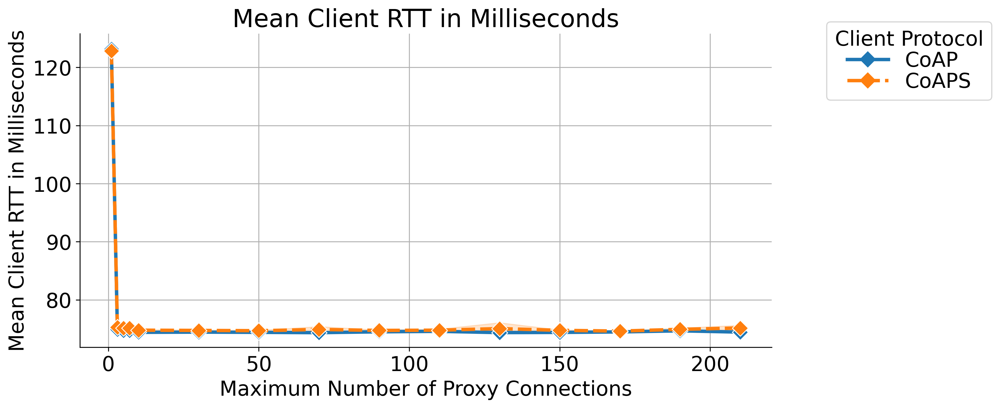

CPU times: user 2.05 s, sys: 171 ms, total: 2.22 s
Wall time: 1.9 s


In [ ]:
%%time

### Plot effect of RTT as a result of increasing number of clients

df = client_rps_df

g = sns.relplot(
  data=df,
  kind="line",
  x="num_proxy_connections",
  y="mean_rtt_ms",
  hue="run_proxy_with_dtls",
  style="run_proxy_with_dtls",
  markers=["D", "D"],
  markersize=10,
  aspect=2,
)

sns.move_legend(
  g, 
  "upper right", 
  title="Client Protocol", 
  frameon=True, 
  labelspacing=0.05,
  bbox_to_anchor=((1, 1)),
  markerfirst=True,
)

g.set_xlabels("Maximum Number of Proxy Connections")
g.set_ylabels("Mean Client RTT in Milliseconds")
g.set(title="Mean Client RTT in Milliseconds")

plt.grid(True, axis="both")
plt.show()

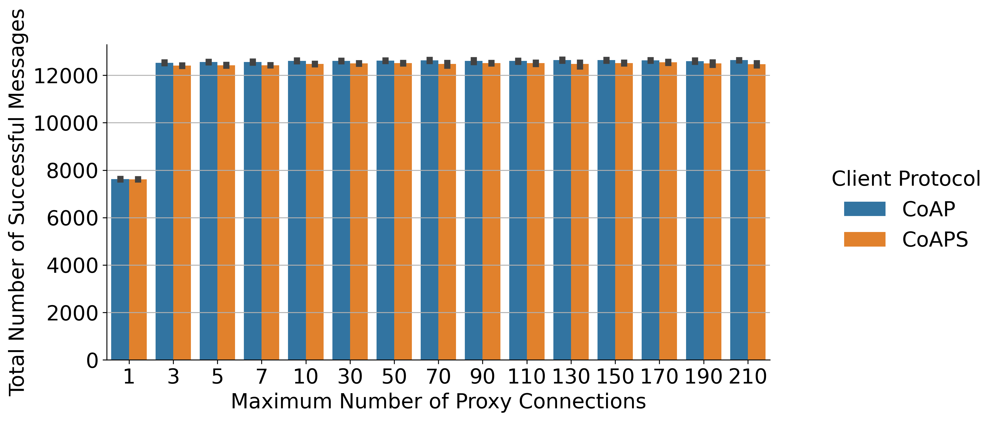

,exp_id,run_proxy_with_dtls,num_clients,num_proxy_connections,mean_total_successful_messages,mean_successful_messages_per_client
0,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,CoAP,8,1,7628.4,953.550
1,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_dtls_https,CoAPS,8,1,7614.2,951.775
2,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_3proxyconns_coap_https,CoAP,8,3,12530.8,1566.350
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_3proxyconns_dtls_https,CoAPS,8,3,12407.0,1550.875
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_5proxyconns_coap_https,CoAP,8,5,12560.6,1570.075
5,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_5proxyconns_dtls_https,CoAPS,8,5,12424.6,1553.075
6,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_7proxyconns_coap_https,CoAP,8,7,12563.2,1570.400
7,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_7proxyconns_dtls_https,CoAPS,8,7,12426.8,1553.350
8,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_10proxyconns_coap_https__140sec_proxy__30sec_attacker__120sec_client,CoAP,8,10,12611.8,1576.475
9,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_10proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,CoAPS,8,10,12480.0,1560.000


In [ ]:
## Plot total number of successful messages.

client_rps_df["active_time_sec"] = client_rps_df["last_active_time"] - client_rps_df["first_active_time"]

df = (
  client_rps_df
  .groupby(by=["exp_id", "run_proxy_with_dtls", "num_clients", "num_proxy_connections", "trial"])
  .agg(
    total_successful_messages=("num_successful_messages", "sum"),
    mean_active_time_sec=("active_time_sec", "mean"),
  )
  .reset_index()
)
df["amortized_successful_rps"] = df["total_successful_messages"] / df["mean_active_time_sec"] / df["num_clients"]

g = sns.catplot(
  data=df,
  kind="bar",
  x="num_proxy_connections",
  y="total_successful_messages",
  hue="run_proxy_with_dtls",
  aspect=2,
  # markers=["_", "_"],
  # scatter=True,
  # fit_reg=False,
)

g.set_xlabels("Maximum Number of Proxy Connections")
g.set_ylabels("Total Number of Successful Messages")
g.legend.set_title("Client Protocol")

plt.grid(True, axis="y")
plt.show()

_df = (
  df
  .groupby(by=["exp_id", "run_proxy_with_dtls", "num_clients", "num_proxy_connections"])
  .agg(
    mean_total_successful_messages=("total_successful_messages", "mean"),
  )
  .reset_index()
)
_df["mean_successful_messages_per_client"] = _df["mean_total_successful_messages"] / _df["num_clients"]
_df

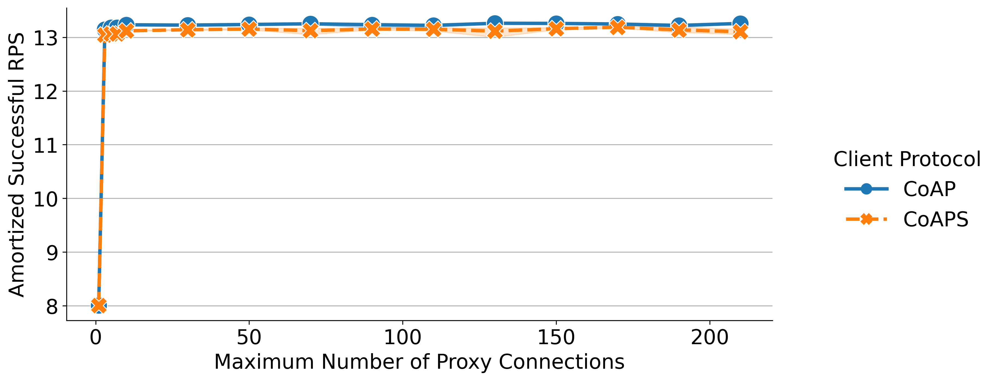

,exp_id,run_proxy_with_dtls,num_clients,num_proxy_connections,mean_amortized_successful_rps,mean_amortized_rps_messages_per_client
0,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,CoAP,8,1,8.003998,1.000500
1,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_dtls_https,CoAPS,8,1,8.004954,1.000619
2,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_3proxyconns_coap_https,CoAP,8,3,13.146914,1.643364
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_3proxyconns_dtls_https,CoAPS,8,3,13.043776,1.630472
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_5proxyconns_coap_https,CoAP,8,5,13.179086,1.647386
5,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_5proxyconns_dtls_https,CoAPS,8,5,13.062865,1.632858
6,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_7proxyconns_coap_https,CoAP,8,7,13.180553,1.647569
7,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_7proxyconns_dtls_https,CoAPS,8,7,13.064707,1.633088
8,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_10proxyconns_coap_https__140sec_proxy__30sec_attacker__120sec_client,CoAP,8,10,13.231942,1.653993
9,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_10proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,CoAPS,8,10,13.119919,1.639990


In [ ]:
g = sns.relplot(
  data=df,
  kind="line",
  x="num_proxy_connections",
  y="amortized_successful_rps",
  hue="run_proxy_with_dtls",
  style="run_proxy_with_dtls",
  aspect=2,
  markers=True,
  markersize=15,
)

g.set_xlabels("Maximum Number of Proxy Connections")
g.set_ylabels("Amortized Successful RPS")
g.legend.set_title("Client Protocol")

plt.grid(True, axis="y")
plt.show()

_df = (
  df
  .groupby(by=["exp_id", "run_proxy_with_dtls", "num_clients", "num_proxy_connections"])
  .agg(
    mean_amortized_successful_rps=("amortized_successful_rps", "mean"),
  )
  .reset_index()
)
_df["mean_amortized_rps_messages_per_client"] = _df["mean_amortized_successful_rps"] / _df["num_clients"]
_df

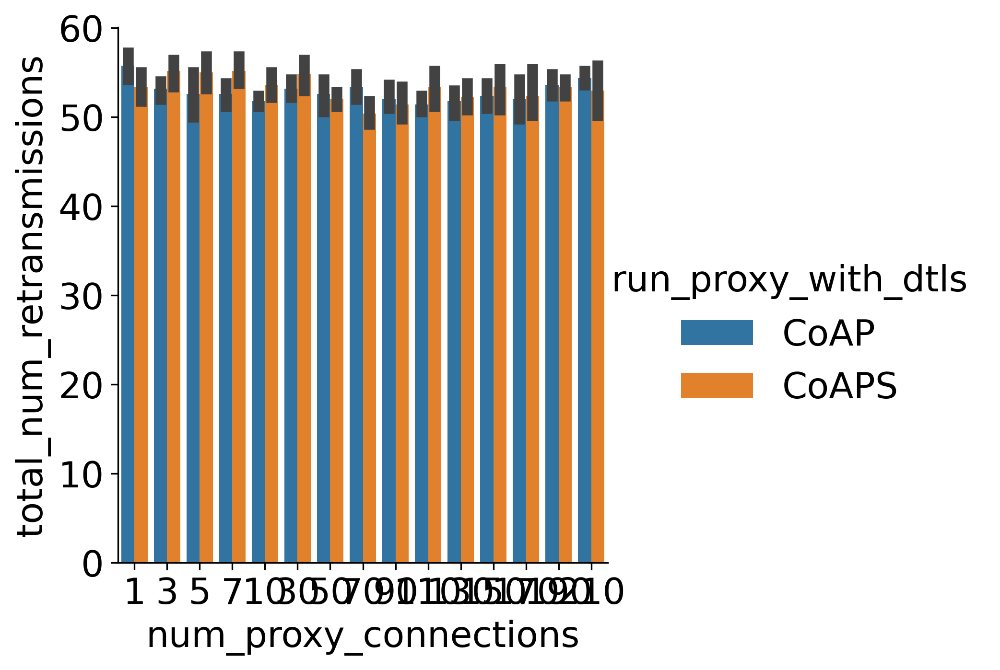

,exp_id,trial,num_clients,run_proxy_with_dtls,num_proxy_connections,total_num_retransmissions
0,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,8,CoAP,1,58
1,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,2,8,CoAP,1,56
2,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,3,8,CoAP,1,56
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,4,8,CoAP,1,53
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,5,8,CoAP,1,56
...,...,...,...,...,...,...
145,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,1,8,CoAPS,90,51
146,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,2,8,CoAPS,90,52
147,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,3,8,CoAPS,90,49
148,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,4,8,CoAPS,90,55


In [ ]:
## Plot retransmissions as a function of clients and protocol.

df = (
  client_rps_df.groupby(by=["exp_id", "trial", "num_clients", "run_proxy_with_dtls", "num_proxy_connections"])
  .agg(
    total_num_retransmissions=("total_num_retransmissions", "sum")
  )
  .reset_index()
)

g = sns.catplot(
  data=df,
  kind="bar",
  x="num_proxy_connections",
  y="total_num_retransmissions",
  hue="run_proxy_with_dtls",
)
plt.show()

df[df["total_num_retransmissions"] > 0]

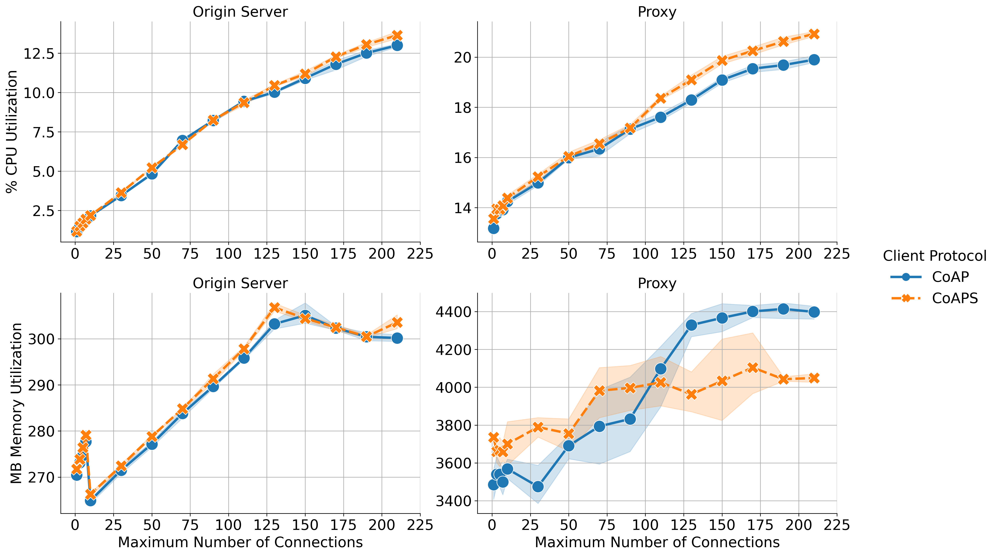

CPU times: user 6.09 s, sys: 168 ms, total: 6.26 s
Wall time: 5.93 s


,exp_id,trial,observer_id,metric_type,avg_value,min_value,max_value,attacker_rate,server_connections,max_keep_alive_requests,...,topology_name,num_proxy_connections,request_timeout,max_retries,keep_alive_duration,request_retry_interval,reuse_connections,run_proxy_with_dtls,run_proxy_with_https,run_attacker
0,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,Origin Server,% CPU Utilization,1.193571,0.4,9.5,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
1,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,Proxy,% CPU Utilization,13.207857,0.5,79.9,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
2,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,Origin Server,MB Memory Utilization,269.396694,257.0,272.0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,Proxy,MB Memory Utilization,3461.143095,252.0,5686.0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,2,Origin Server,% CPU Utilization,1.154286,0.4,9.4,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,4,Proxy,MB Memory Utilization,3834.353923,253.0,6369.0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,CoAPS,True,True
596,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,Origin Server,% CPU Utilization,8.295000,0.3,36.8,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,CoAPS,True,True
597,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,Proxy,% CPU Utilization,17.153571,0.5,91.7,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,CoAPS,True,True
598,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,Origin Server,MB Memory Utilization,293.013289,262.0,346.0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,CoAPS,True,True


In [12]:
%%time

## Measure proxy and server metrics.

df = (
  metric_df.replace({
    "metric_type": {
      "cpu_utilization": "% CPU Utilization",
      "memory_utilization": "MB Memory Utilization",
    },
    "observer_id": {
      "proxy": "Proxy",
      "originserver": "Origin Server",
    },
  })
)

g = sns.relplot(
  data=df,
  kind="line",
  x="num_proxy_connections",
  y="avg_value",
  col="observer_id",
  row="metric_type",
  hue="run_proxy_with_dtls",
  style="run_proxy_with_dtls",
  markers=True,
  markersize=15,
  facet_kws={
    "sharey": False,
    "sharex": False,
  },
  aspect=1.5,
)

g.set_titles(
  template="{col_name}",
  col_template="{col_name}",
  row_template="{row_name}",
)
g.set_xlabels("Maximum Number of Connections")
g.set_ylabels("Average Metric Value")
g.legend.set_title("Client Protocol")
g.set(
  xticks=np.arange(0,231,25)
)

g.axes[0,0].set_ylabel("% CPU Utilization")
g.axes[0,1].set_ylabel("")
# g.axes[0,0].set_ylim(0,4)
# g.axes[0,1].set_ylim(0,4)

g.axes[1,0].set_ylabel("MB Memory Utilization")
g.axes[1,1].set_ylabel("")
# g.axes[1,0].set_ylim(250, 500)
# g.axes[1,1].set_ylim(250, 500)

g.axes[0,0].grid(True, axis="both")
g.axes[0,1].grid(True, axis="both")
g.axes[1,0].grid(True, axis="both")
g.axes[1,1].grid(True, axis="both")

plt.show()

df

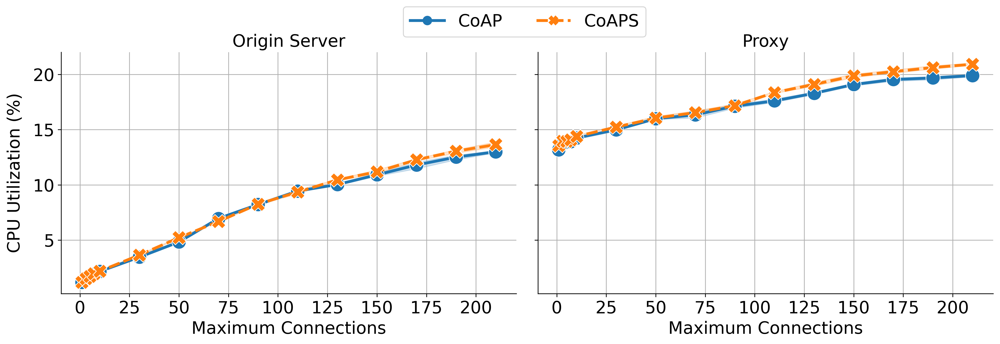

CPU times: user 3.08 s, sys: 168 ms, total: 3.25 s
Wall time: 2.94 s


,exp_id,trial,observer_id,metric_type,avg_value,min_value,max_value,attacker_rate,server_connections,max_keep_alive_requests,...,topology_name,num_proxy_connections,request_timeout,max_retries,keep_alive_duration,request_retry_interval,reuse_connections,run_proxy_with_dtls,run_proxy_with_https,run_attacker
0,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,Origin Server,% CPU Utilization,1.193571,0.4,9.5,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
1,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,Proxy,% CPU Utilization,13.207857,0.5,79.9,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,2,Origin Server,% CPU Utilization,1.154286,0.4,9.4,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
5,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,2,Proxy,% CPU Utilization,13.208571,0.5,79.8,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
8,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,3,Origin Server,% CPU Utilization,1.113571,0.4,10.5,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
589,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,3,Proxy,% CPU Utilization,16.982143,0.4,90.0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,CoAPS,True,True
592,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,4,Origin Server,% CPU Utilization,8.207143,0.5,33.5,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,CoAPS,True,True
593,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,4,Proxy,% CPU Utilization,17.400714,0.5,90.3,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,CoAPS,True,True
596,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,Origin Server,% CPU Utilization,8.295000,0.3,36.8,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,CoAPS,True,True


In [19]:
%%time

## Measure proxy and server metrics.

df = (
  metric_df.replace({
    "metric_type": {
      "cpu_utilization": "% CPU Utilization",
      "memory_utilization": "MB Memory Utilization",
    },
    "observer_id": {
      "proxy": "Proxy",
      "originserver": "Origin Server",
    },
  })
)
df = df[df["metric_type"] == "% CPU Utilization"]

g = sns.relplot(
  data=df,
  kind="line",
  x="num_proxy_connections",
  y="avg_value",
  col="observer_id",
  hue="run_proxy_with_dtls",
  style="run_proxy_with_dtls",
  markers=True,
  markersize=15,
  facet_kws={
    "sharey": True,
    "sharex": True,
  },
  aspect=1.5,
)

g.set_titles(
  template="{col_name}",
  col_template="{col_name}",
  row_template="{row_name}",
)
g.set_xlabels("Maximum Connections")

g.axes[0,0].set_ylabel("CPU Utilization (%)", labelpad=10)
g.axes[0,1].set_ylabel("")

g.axes[0,0].grid(True, axis="both")
g.axes[0,1].grid(True, axis="both")

g.set(
  xticks=np.arange(0, 221, 25)
)

sns.move_legend(
  g,
  "upper center",
  bbox_to_anchor=(0.45, 1.05),
  ncol=2,
  title=None,
  frameon=True,
)

plt.show()

df

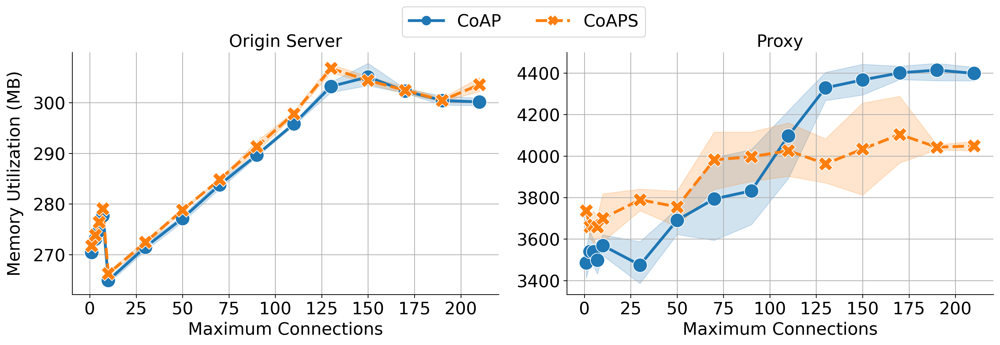

CPU times: user 3.29 s, sys: 142 ms, total: 3.43 s
Wall time: 3.12 s


,exp_id,trial,observer_id,metric_type,avg_value,min_value,max_value,attacker_rate,server_connections,max_keep_alive_requests,...,topology_name,num_proxy_connections,request_timeout,max_retries,keep_alive_duration,request_retry_interval,reuse_connections,run_proxy_with_dtls,run_proxy_with_https,run_attacker
2,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,Origin Server,MB Memory Utilization,269.396694,257.0,272.0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,Proxy,MB Memory Utilization,3461.143095,252.0,5686.0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
6,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,2,Origin Server,MB Memory Utilization,270.294215,257.0,271.0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
7,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,2,Proxy,MB Memory Utilization,3475.841930,256.0,5693.0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
10,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,3,Origin Server,MB Memory Utilization,270.573554,259.0,272.0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
591,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,3,Proxy,MB Memory Utilization,4085.479132,252.0,6957.0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,CoAPS,True,True
594,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,4,Origin Server,MB Memory Utilization,292.182724,262.0,340.0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,CoAPS,True,True
595,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,4,Proxy,MB Memory Utilization,3834.353923,253.0,6369.0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,CoAPS,True,True
598,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,Origin Server,MB Memory Utilization,293.013289,262.0,346.0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,CoAPS,True,True


In [18]:
%%time

## Measure proxy and server metrics.

df = (
  metric_df.replace({
    "metric_type": {
      "cpu_utilization": "% CPU Utilization",
      "memory_utilization": "MB Memory Utilization",
    },
    "observer_id": {
      "proxy": "Proxy",
      "originserver": "Origin Server",
    },
  })
)
df = df[df["metric_type"] == "MB Memory Utilization"]

g = sns.relplot(
  data=df,
  kind="line",
  x="num_proxy_connections",
  y="avg_value",
  col="observer_id",
  hue="run_proxy_with_dtls",
  style="run_proxy_with_dtls",
  markers=True,
  markersize=15,
  facet_kws={
    "sharey": False,
    "sharex": True,
  },
  aspect=1.5,
)

g.set_titles(
  template="{col_name}",
  col_template="{col_name}",
  row_template="{row_name}",
)
g.set_xlabels("Maximum Connections")

g.axes[0,0].set_ylabel("Memory Utilization (MB)", labelpad=10)
g.axes[0,1].set_ylabel("")

g.axes[0,0].grid(True, axis="both")
g.axes[0,1].grid(True, axis="both")

g.set(
  xticks=np.arange(0, 221, 25)
)

sns.move_legend(
  g,
  "upper center",
  bbox_to_anchor=(0.45, 1.05),
  ncol=2,
  title=None,
  frameon=True,
)

plt.show()

df

In [ ]:
g.set(
  xticks=np.arange(0, 221, 25)
)

sns.move_legend(
  g,
  "upper center",
  bbox_to_anchor=(0.45, 1.05),
  ncol=2,
  title=None,
  frameon=True,
)

plt.show()

df

In [17]:
(
  df
  .groupby(
    by=["num_proxy_connections", "observer_id", "run_proxy_with_dtls", "metric_type"]
  )
  .agg(
    avg_value=("avg_value", "mean")
  )
  .reset_index()
  .sort_values(
    by=["num_proxy_connections", "observer_id", "run_proxy_with_dtls", "metric_type"]
  )
  .head(20)
)

,num_proxy_connections,observer_id,run_proxy_with_dtls,metric_type,avg_value
0,1,Origin Server,CoAP,% CPU Utilization,1.164857
1,1,Origin Server,CoAP,MB Memory Utilization,270.443517
2,1,Origin Server,CoAPS,% CPU Utilization,1.167143
3,1,Origin Server,CoAPS,MB Memory Utilization,271.731570
4,1,Proxy,CoAP,% CPU Utilization,13.172429
5,1,Proxy,CoAP,MB Memory Utilization,3485.499838
6,1,Proxy,CoAPS,% CPU Utilization,13.554571
7,1,Proxy,CoAPS,MB Memory Utilization,3735.979525
8,3,Origin Server,CoAP,% CPU Utilization,1.486000
9,3,Origin Server,CoAP,MB Memory Utilization,273.119933


In [18]:
(
  df
  .groupby(
    by=["num_proxy_connections", "observer_id", "run_proxy_with_dtls", "metric_type"]
  )
  .agg(
    avg_value=("avg_value", "mean")
  )
  .reset_index()
  .sort_values(
    by=["num_proxy_connections", "observer_id", "run_proxy_with_dtls", "metric_type"]
  )
  .tail(20)
)

,num_proxy_connections,observer_id,run_proxy_with_dtls,metric_type,avg_value
100,170,Proxy,CoAP,% CPU Utilization,19.538857
101,170,Proxy,CoAP,MB Memory Utilization,4400.715172
102,170,Proxy,CoAPS,% CPU Utilization,20.250857
103,170,Proxy,CoAPS,MB Memory Utilization,4104.052202
104,190,Origin Server,CoAP,% CPU Utilization,12.509816
105,190,Origin Server,CoAP,MB Memory Utilization,300.429778
106,190,Origin Server,CoAPS,% CPU Utilization,13.052429
107,190,Origin Server,CoAPS,MB Memory Utilization,300.476134
108,190,Proxy,CoAP,% CPU Utilization,19.682714
109,190,Proxy,CoAP,MB Memory Utilization,4414.122351


In [19]:
%%time

## Measure proxy and server connection management.
##
## We currently do not insert connection events to
## the database, so we have to read from the processed
## connection files.

ALL_EXPERIMENTS_DATA_HOME = "/home/ubuntu/dos-californium/deter/expdata/real/final"

def read_exp_trial_node_connections(exp_id):
  """
  Read all processed connection dumps in an experiment `exp_id`.
  """
  experiment_dir = os.path.join(ALL_EXPERIMENTS_DATA_HOME, exp_id)

  df = (
    pl
    .scan_parquet(
      f"{experiment_dir}/*/{exp_id}.connections.parquet"
    )
  )
  lazy_dfs.append(df)

lazy_dfs = list()
for exp_id in exp_df["exp_id"].unique():
  read_exp_trial_node_connections(exp_id)

connections_df = (
  pl
  .concat(lazy_dfs)

  # Filter for proxy's view of syn-acks or fin-acks coming from server
  .filter(
    (pl.col("observer_id") == "proxy")
    & ((pl.col("is_syn") == 1) | (pl.col("is_fin") == 1))
    & (pl.col("info").str.contains(", ACK]"))
    & (pl.col("src_port") == 443)
  )
  # Group by experiment, trial, and observer, then accummulate
  # syn-acks and fin-acks in a list, along with their corresponding
  # timestamps of occurrence for each group.
  .groupby(
    by=["exp_id", "trial", "observer_id"],
    maintain_order=True
  )
  .agg([
    pl.col("timestamp").alias("timestamp"),
    pl.col("is_syn").cumsum().alias("cum_syn"),
    pl.col("is_fin").cumsum().alias("cum_fin"),
  ])
  # Explode the cumulative syns and fins, and their times, then
  # subtract them to get a view of how many open connections there
  # are in the experiment as a function of time
  .explode(columns=["timestamp", "cum_syn", "cum_fin"])
  .with_columns([
    (pl.col("cum_syn") - pl.col("cum_fin")).alias("open_connections")
  ])

  # And finally convert to pandas for plotting.
  .collect()
  .to_pandas()
)

# This method of counting does not include the original 0 connections
# at time 0 for each node in each trial -- so we add that manually.
records = list()
for e in connections_df["exp_id"].unique():
  for t in connections_df["trial"].unique():
    for o in connections_df["observer_id"].unique():
      records.append({
        "exp_id"          : e,
        "trial"           : t,
        "observer_id"     : o,
        "timestamp"       : 0.0,
        "cum_syn"         : 0,
        "cum_fin"         : 0,
        "open_connections": 0,
      })
connections_df = (
  pd.concat(
    [connections_df, pd.DataFrame.from_records(records)]
  )
  .sort_values(by=["exp_id", "trial", "observer_id", "timestamp"])
)

# This method also does not include a connection count at the last time
# the proxy is meant to be active -- so we fill that value in based on the
# last value.
last_connection_df = (
  connections_df
  .groupby(by=["exp_id", "trial", "observer_id"], sort=True)
  .agg(
    max_timestamp=("timestamp", "max"),
    last_timestamp=("timestamp", "last"),
    max_open_connections=("open_connections", "max"),
    last_open_connections=("open_connections", "last"),
    last_cum_syn=("cum_syn", "last"),
    last_cum_fin=("cum_fin", "last"),
  )
  .reset_index()
)
# assert last_connection_df["max_timestamp"].equals(last_connection_df["last_timestamp"])
# assert last_connection_df["max_open_connections"].equals(last_connection_df["last_open_connections"])
records = list()
for r in last_connection_df.to_dict(orient="records"):
  records.append({
    "exp_id"          : r["exp_id"],
    "trial"           : r["trial"],
    "observer_id"     : r["observer_id"],
    "timestamp"       : 140,
    "cum_syn"         : r["last_cum_syn"],
    "cum_fin"         : r["last_cum_fin"],
    "open_connections": r["last_open_connections"],
  })
connections_df = (
  pd.concat(
    [connections_df, pd.DataFrame.from_records(records)]
  )
  .sort_values(by=["exp_id", "trial", "observer_id", "timestamp"])
)

connections_df = (
  connections_df
  .merge(exp_df, on="exp_id", how="left")
  .replace({
    "run_proxy_with_dtls": {
      True : "CoAPS",
      False: "CoAP",
    },
  })
)

connections_df

CPU times: user 7min 33s, sys: 15min 5s, total: 22min 38s
Wall time: 1min 55s


,exp_id,trial,observer_id,timestamp,cum_syn,cum_fin,open_connections,attacker_rate,server_connections,max_keep_alive_requests,...,topology_name,num_proxy_connections,request_timeout,max_retries,keep_alive_duration,request_retry_interval,reuse_connections,run_proxy_with_dtls,run_proxy_with_https,run_attacker
0,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,proxy,0.000000,0,0,0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
1,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,proxy,0.063143,1,0,1,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
2,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,proxy,140.000000,1,0,1,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,2,proxy,0.000000,0,0,0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,2,proxy,0.064441,1,0,1,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,CoAP,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27419,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,proxy,128.488400,96,93,3,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,CoAPS,True,True
27420,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,proxy,128.861275,96,94,2,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,CoAPS,True,True
27421,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,proxy,129.513954,96,95,1,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,CoAPS,True,True
27422,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,proxy,131.535029,96,96,0,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,CoAPS,True,True


In [20]:
%%time

## Measure proxy and server connection management.

df = connections_df

# plt.rcParams['font.size'] = '25'

g = sns.relplot(
  data=df,
  kind="line",
  x="timestamp",
  y="open_connections",
  hue="run_proxy_with_dtls",
  style="run_proxy_with_dtls",
  col="num_proxy_connections",
  col_wrap=2,
  markers=True,
  markersize=20,
  facet_kws={
    "sharey": True,
    "sharex": True,
  },
  aspect=2,
)
g.set_xlabels("Timestamp in Seconds")
g.set_ylabels("Open Connections", labelpad=20)
g.legend.set_title("Client Protocol")
# g.set(yticks=np.arange(1,9,1))
# for i in range(8):
#   g.axes[i].grid(True, axis="both")

plt.show()

CPU times: user 32.6 s, sys: 3.9 s, total: 36.5 s
Wall time: 37 s


In [21]:
%%time 

client_journey_sql = f"""
WITH client_sends AS (
  SELECT
  dn.exp_id AS exp_id,
  e.observer_id AS observer_id,
  e.observe_timestamp AS observe_timestamp,
  e.trial AS trial,
  e.message_marker AS message_marker
  FROM event e
  JOIN message m ON m.message_id = e.message_id
  JOIN deployed_node dn ON dn.dnid = e.observer_id
  WHERE e.observer_id IN ({','.join(map(str, client_dnids))})   -- client dnids
  AND m.src_id IN ({','.join(map(str, client_node_ids))}) -- clients are senders (node ID)
),

proxy_events AS (
  SELECT
  dn.exp_id AS exp_id,
  e.observe_timestamp AS observe_timestamp,
  e.trial AS trial,
  e.message_marker AS message_marker
  FROM event e
  JOIN deployed_node dn ON dn.dnid = e.observer_id
  WHERE e.observer_id IN ({','.join(map(str, proxy_dnids))})   -- proxy dnids
),

client_recvs AS (
  SELECT
  dn.exp_id AS exp_id,
  e.observer_id AS observer_id,
  e.observe_timestamp AS observe_timestamp,
  e.trial AS trial,
  e.message_marker AS message_marker,
  cm.coap_code AS coap_code
  FROM event e
  JOIN message m ON m.message_id = e.message_id
  JOIN coap_message cm ON cm.cmci = m.coap_message
  JOIN deployed_node dn ON dn.dnid = e.observer_id
  WHERE e.observer_id IN ({','.join(map(str, client_dnids))})   -- client dnids
  AND m.dst_id IN ({','.join(map(str, client_node_ids))}) -- clients are receivers (node ID)
)

SELECT
  client_sends.exp_id AS exp_id,
  client_sends.observer_id AS observer_id,
  client_sends.trial AS trial,
  client_sends.message_marker AS message_marker,
  (groupArray(client_recvs.coap_code))[1] AS coap_code,
  MIN(client_sends.observe_timestamp) AS first_send_time_sec,
  1e3 * (MAX(client_recvs.observe_timestamp) - MIN(client_sends.observe_timestamp)) AS client_to_self_rtt_ms,
  MIN(client_recvs.observe_timestamp) AS first_recv_time_sec
FROM
  client_sends
  JOIN client_recvs
    ON client_recvs.exp_id = client_sends.exp_id
    AND client_recvs.trial = client_sends.trial
    AND client_recvs.message_marker = client_sends.message_marker
    AND client_recvs.observer_id = client_sends.observer_id
GROUP BY
  client_sends.exp_id, client_sends.observer_id, client_sends.trial, client_sends.message_marker
ORDER BY
  exp_id, trial, message_marker, first_send_time_sec
"""

client_journey_df = client.query_dataframe(client_journey_sql)

client_journey_df.observer_id.replace(dnid_map_node_name, inplace=True)

client_journey_df

Error on localhost:9000 ping: Unexpected EOF while reading bytes
Connection was closed, reconnecting.
Error on socket shutdown: [Errno 107] Transport endpoint is not connected
Failed to connect to localhost:9000
Traceback (most recent call last):
  File "/home/ubuntu/.local/lib/python3.8/site-packages/clickhouse_driver/connection.py", line 325, in connect
    return self._init_connection(host, port)
  File "/home/ubuntu/.local/lib/python3.8/site-packages/clickhouse_driver/connection.py", line 289, in _init_connection
    self.socket = self._create_socket(host, port)
  File "/home/ubuntu/.local/lib/python3.8/site-packages/clickhouse_driver/connection.py", line 261, in _create_socket
    raise err
  File "/home/ubuntu/.local/lib/python3.8/site-packages/clickhouse_driver/connection.py", line 252, in _create_socket
    sock.connect(sa)
ConnectionRefusedError: [Errno 111] Connection refused


NetworkError: Code: 210. Connection refused (localhost:9000)

In [ ]:
%%time

# `client_journey_df` is far too detailed for plotting, but
# is useful for non-plotting use-cases so we keep it around.
# But for plotting, we summarize RTTs in discrete intervals
# of time instead, thus reducing the amount of data.

reduced_client_journey_df = (
  client_journey_df
  .groupby(by=[
    "exp_id", "observer_id", "trial",
    pd.cut(client_journey_df["first_send_time_sec"], np.arange(0,121,5))
  ])
  .agg(
    client_to_self_rtt_ms=("client_to_self_rtt_ms", "mean"),
  )
  .reset_index()
  .melt(
    id_vars=["exp_id", "observer_id", "trial", "first_send_time_sec"],
    value_vars=["client_to_self_rtt_ms"],
    var_name="sub_journey_name",
    value_name="sub_journey_time_ms",
  )
)

reduced_client_journey_df["first_send_time_sec"] = reduced_client_journey_df["first_send_time_sec"].map(operator.attrgetter("right"))
reduced_client_journey_df = reduced_client_journey_df.merge(exp_df, on="exp_id", how="left")

reduced_client_journey_df

CPU times: user 1.42 s, sys: 6.29 ms, total: 1.43 s
Wall time: 1.42 s


,exp_id,observer_id,trial,first_send_time_sec,sub_journey_name,sub_journey_time_ms,attacker_rate,server_connections,max_keep_alive_requests,num_clients,...,topology_name,num_proxy_connections,request_timeout,max_retries,keep_alive_duration,request_retry_interval,reuse_connections,run_proxy_with_dtls,run_proxy_with_https,run_attacker
0,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,client1,1,5,client_to_self_rtt_ms,56.220481,100mbps,256,0,8,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
1,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,client1,1,10,client_to_self_rtt_ms,82.492944,100mbps,256,0,8,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
2,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,client1,1,15,client_to_self_rtt_ms,91.755112,100mbps,256,0,8,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,client1,1,20,client_to_self_rtt_ms,91.143807,100mbps,256,0,8,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,client1,1,25,client_to_self_rtt_ms,90.888522,100mbps,256,0,8,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28795,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,client8,5,100,client_to_self_rtt_ms,52.341563,100mbps,256,0,8,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True
28796,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,client8,5,105,client_to_self_rtt_ms,52.232494,100mbps,256,0,8,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True
28797,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,client8,5,110,client_to_self_rtt_ms,52.166848,100mbps,256,0,8,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True
28798,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,client8,5,115,client_to_self_rtt_ms,52.140799,100mbps,256,0,8,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True


In [ ]:
%%time

df = reduced_client_journey_df

g = sns.relplot(
  data=df,
  kind="line",
  x="first_send_time_sec",
  y="sub_journey_time_ms",
  hue="sub_journey_name",
  style="run_proxy_with_dtls",
  col="num_proxy_connections",
  col_wrap=2,
  markers=True,
  markersize=20,
  aspect=1.5,
)

plt.show()

CPU times: user 28.9 s, sys: 382 ms, total: 29.3 s
Wall time: 29 s


In [ ]:
%%time

_df = (
  reduced_client_journey_df[
    (reduced_client_journey_df["num_proxy_connections"] > 0)
    & (reduced_client_journey_df["first_send_time_sec"] >= 75)
  ]
  .groupby(
    by=["num_proxy_connections", "run_proxy_with_dtls"]
  )
  .agg(
    altered_mean_rtt_ms=("sub_journey_time_ms", "mean"),
  )
)

_df

CPU times: user 30.8 ms, sys: 638 µs, total: 31.5 ms
Wall time: 26.2 ms


altered_mean_rtt_ms
num_proxy_connections run_proxy_with_dtls                     
1                     False                          91.547000
                      True                           91.479059
3                     False                          54.781048
                      True                           53.994892
5                     False                          54.172898
                      True                           53.425275
7                     False                          54.139013
                      True                           53.777971
10                    False                          53.830076
                      True                           53.095704
30                    False                          54.497048
                      True                           53.286260
50                    False                          53.207781
                      True                           53.451447
70                    False                          53.221533
                      True                           53.198062
90                    False                          53.668953
                      True                           53.049191
110                   False                          53.627626
                      True                           53.154832
130                   False                          53.390381
                      True                           53.386439
150                   False                          53.082228
                      True                           53.722833
170                   False                          53.531678
                      True                           53.605584
190                   False                          54.214823
                      True                           53.193286
210                   False                          54.158369
                      True                           53.487592

In [ ]:
%%time

_df = (
  reduced_client_journey_df[
    (reduced_client_journey_df["num_proxy_connections"] > 0)
    & (reduced_client_journey_df["first_send_time_sec"] <= 30)
  ]
  .groupby(
    by=["num_proxy_connections", "run_proxy_with_dtls"]
  )
  .agg(
    altered_mean_rtt_ms=("sub_journey_time_ms", "mean"),
  )
)

_df

CPU times: user 28.9 ms, sys: 783 µs, total: 29.7 ms
Wall time: 28.1 ms


altered_mean_rtt_ms
num_proxy_connections run_proxy_with_dtls                     
1                     False                          86.108940
                      True                           85.775810
3                     False                          53.266888
                      True                           53.527372
5                     False                          53.152922
                      True                           53.487974
7                     False                          53.214271
                      True                           53.499622
10                    False                          52.999756
                      True                           53.266125
30                    False                          53.091266
                      True                           53.328547
50                    False                          53.043752
                      True                           53.266533
70                    False                          53.015493
                      True                           53.284741
90                    False                          53.068284
                      True                           53.319787
110                   False                          53.106446
                      True                           53.270035
130                   False                          53.075677
                      True                           53.277475
150                   False                          53.081089
                      True                           53.279308
170                   False                          53.072774
                      True                           53.260339
190                   False                          53.080897
                      True                           53.285336
210                   False                          53.069676
                      True                           53.278283

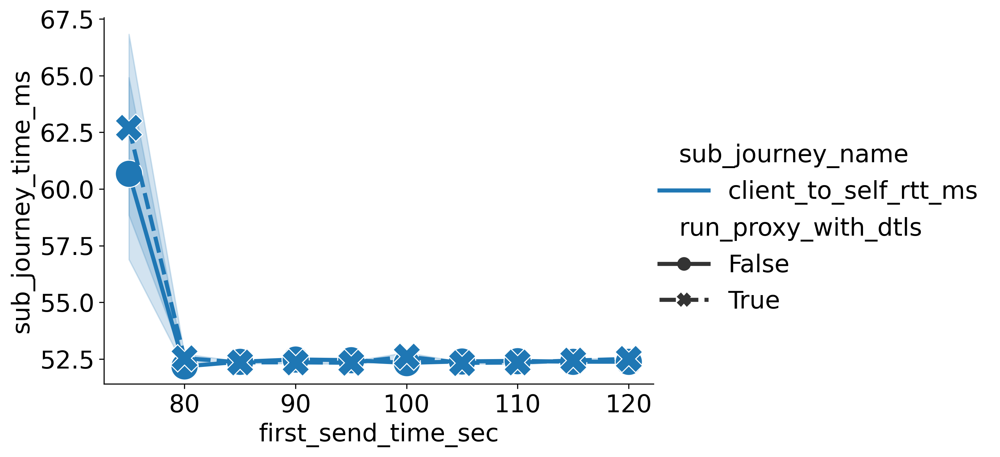

CPU times: user 1.66 s, sys: 234 ms, total: 1.89 s
Wall time: 1.57 s


In [ ]:
%%time

df = reduced_client_journey_df

g = sns.relplot(
  data=df[
    (df["num_proxy_connections"] == 50)
    & (df["first_send_time_sec"] >= 75)
  ],
  kind="line",
  x="first_send_time_sec",
  y="sub_journey_time_ms",
  hue="sub_journey_name",
  style="run_proxy_with_dtls",
  markers=True,
  markersize=20,
  aspect=1.5,
)

plt.show()

In [ ]:
%%time

originserver_message_sql = f"""
WITH originserver_recvs AS (
  SELECT
  dn.exp_id AS exp_id,
  e.observer_id AS observer_id,
  e.observe_timestamp AS observe_timestamp,
  e.trial AS trial,
  e.message_marker AS message_marker,
  hm.http_response_code AS http_response_code
  FROM event e
  JOIN message m ON m.message_id = e.message_id
  JOIN http_message hm ON hm.hmci = m.http_message
  JOIN deployed_node dn ON dn.dnid = e.observer_id
  WHERE e.observer_id IN ({','.join(map(str, originserver_dnids))})   -- originserver dnids
  AND m.dst_id IN ({','.join(map(str, originserver_node_ids))}) -- originservers are receivers (node ID)
),

originserver_response_breakdown AS (
  SELECT
    exp_id,
    trial,
    observer_id,
    http_response_code AS response_code,
    COUNT(http_response_code) AS response_code_count
  FROM
    originserver_recvs
  GROUP BY
    exp_id, trial, observer_id, response_code
  ORDER BY
    exp_id, trial, observer_id, response_code
),

originserver_response_count AS (
  SELECT
    exp_id,
    trial,
    observer_id,
    SUM(response_code_count) AS response_count
  FROM
    originserver_response_breakdown
  GROUP BY
    exp_id, trial, observer_id
  ORDER BY
    exp_id, trial, observer_id
)

SELECT * FROM originserver_response_breakdown
"""

originserver_message_df = client.query_dataframe(originserver_message_sql)

# originserver_message_df.observer_id.replace(dnid_map_node_name, inplace=True)

originserver_message_df

CPU times: user 5.53 ms, sys: 0 ns, total: 5.53 ms
Wall time: 199 ms


""


In [ ]:
%%time

originserver_message_sql = f"""
WITH originserver_recvs AS (
  SELECT
    dn.exp_id AS exp_id,
    e.observer_id AS observer_id,
    e.observe_timestamp AS observe_timestamp,
    e.trial AS trial,
    e.message_marker AS message_marker,
    hm.http_response_code AS http_response_code,
    m.src_id AS src_id,
    m.dst_id AS dst_id
  FROM
    event e
  JOIN
    message m ON m.message_id = e.message_id
  JOIN
    http_message hm ON hm.hmci = m.http_message
  JOIN
    deployed_node dn ON dn.dnid = e.observer_id
  WHERE
    e.observer_id IN ({','.join(map(str, proxy_dnids))})   -- proxy dnids
    AND (
      m.src_id IN ({','.join(map(str, originserver_node_ids))}) -- originservers are senders (node ID)
      OR m.dst_id IN ({','.join(map(str, originserver_node_ids))}) -- originservers are receivers (node ID)
    )
),

originserver_response_breakdown AS (
  SELECT
    exp_id,
    trial,
    observer_id,
    src_id,
    dst_id,
    http_response_code AS response_code,
    COUNT(http_response_code) AS response_code_count
  FROM
    originserver_recvs
  GROUP BY
    exp_id, trial, observer_id, src_id, dst_id, response_code
  ORDER BY
    exp_id, trial, observer_id, src_id, dst_id, response_code
)

SELECT * FROM originserver_response_breakdown
"""

originserver_message_df = client.query_dataframe(originserver_message_sql)

originserver_message_df.replace({
  "observer_id": dnid_map_node_name,
  "src_id": node_id_map_node_name,
  "dst_id": node_id_map_node_name,
}, inplace=True)

originserver_message_df = originserver_message_df.merge(exp_df, on="exp_id", how="left")

originserver_message_df

CPU times: user 131 ms, sys: 7.98 ms, total: 139 ms
Wall time: 46.5 s


,exp_id,trial,observer_id,src_id,dst_id,response_code,response_code_count,attacker_rate,server_connections,max_keep_alive_requests,...,topology_name,num_proxy_connections,request_timeout,max_retries,keep_alive_duration,request_retry_interval,reuse_connections,run_proxy_with_dtls,run_proxy_with_https,run_attacker
0,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,proxy,originserver,proxy,200,9495,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
1,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,proxy,proxy,originserver,-1,9495,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
2,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,2,proxy,originserver,proxy,200,9483,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,2,proxy,proxy,originserver,-1,9483,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,3,proxy,originserver,proxy,200,9418,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,3,proxy,proxy,originserver,-1,54355,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True
296,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,4,proxy,originserver,proxy,200,78747,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True
297,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,4,proxy,proxy,originserver,-1,78816,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True
298,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,proxy,originserver,proxy,200,145536,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True


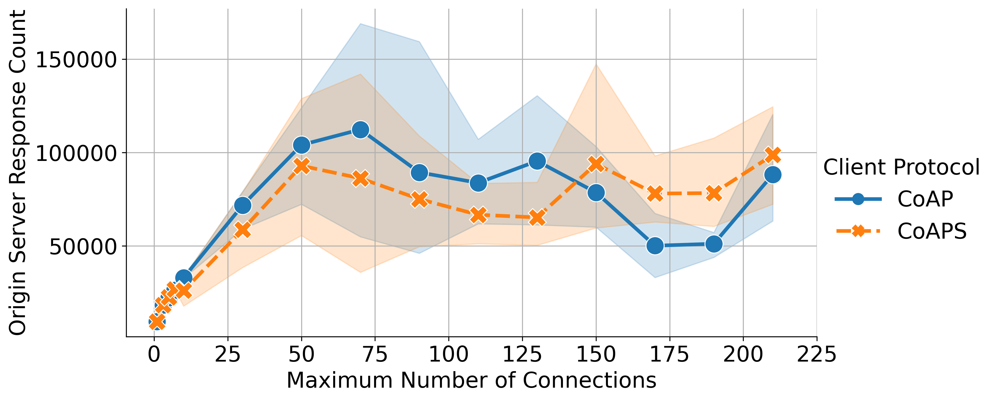

CPU times: user 1.87 s, sys: 141 ms, total: 2.01 s
Wall time: 1.7 s


,exp_id,trial,observer_id,src_id,dst_id,Response Code,response_code_count,attacker_rate,server_connections,max_keep_alive_requests,...,topology_name,num_proxy_connections,request_timeout,max_retries,keep_alive_duration,request_retry_interval,reuse_connections,Client Protocol,run_proxy_with_https,run_attacker
0,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,proxy,originserver,proxy,200,9495,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,Reuse Connections,CoAP,True,With Attacker
2,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,2,proxy,originserver,proxy,200,9483,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,Reuse Connections,CoAP,True,With Attacker
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,3,proxy,originserver,proxy,200,9418,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,Reuse Connections,CoAP,True,With Attacker
6,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,4,proxy,originserver,proxy,200,9500,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,Reuse Connections,CoAP,True,With Attacker
8,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,5,proxy,originserver,proxy,200,9540,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,Reuse Connections,CoAP,True,With Attacker
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
290,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,1,proxy,originserver,proxy,200,53594,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,Reuse Connections,CoAPS,True,With Attacker
292,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,2,proxy,originserver,proxy,200,43388,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,Reuse Connections,CoAPS,True,With Attacker
294,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,3,proxy,originserver,proxy,200,54265,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,Reuse Connections,CoAPS,True,With Attacker
296,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,4,proxy,originserver,proxy,200,78747,100mbps,256,0,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,Reuse Connections,CoAPS,True,With Attacker


In [ ]:
%%time

df = (
  originserver_message_df[originserver_message_df["dst_id"] == "proxy"]
  .replace(value_map_replacement)
  .rename(columns={
    "response_code": "Response Code",
    "run_proxy_with_dtls": "Client Protocol",
  })
)

g = sns.relplot(
  data=df,
  kind="line",
  x="num_proxy_connections",
  y="response_code_count",
  hue="Client Protocol",
  style="Client Protocol",
  markers=True,
  markersize=15,
  aspect=2,
)

g.set_xlabels("Maximum Number of Connections")
g.set_ylabels("Origin Server Response Count")
g.set(
  xticks=np.arange(0,231,25)
)

plt.grid(True, axis="both")
plt.show()

df

In [20]:
%%time

attacker_message_sql = f"""
WITH attacker_recvs AS (
  SELECT
  dn.exp_id AS exp_id,
  e.observer_id AS observer_id,
  e.observe_timestamp AS observe_timestamp,
  e.trial AS trial,
  e.message_marker AS message_marker,
  cm.coap_code AS coap_code
  FROM event e
  JOIN message m ON m.message_id = e.message_id
  JOIN coap_message cm ON cm.cmci = m.coap_message
  JOIN deployed_node dn ON dn.dnid = e.observer_id
  WHERE e.observer_id IN ({','.join(map(str, attacker_dnids))})   -- attacker dnids
  AND m.dst_id IN ({','.join(map(str, attacker_node_ids))}) -- attackers are receivers (node ID)
),

attacker_response_breakdown AS (
  SELECT
    exp_id,
    trial,
    observer_id,
    coap_code AS response_code,
    COUNT(coap_code) AS response_code_count
  FROM
    attacker_recvs
  GROUP BY
    exp_id, trial, observer_id, response_code
  ORDER BY
    exp_id, trial, observer_id, response_code
),

attacker_response_count AS (
  SELECT
    exp_id,
    trial,
    observer_id,
    SUM(response_code_count) AS response_count
  FROM
    attacker_response_breakdown
  GROUP BY
    exp_id, trial, observer_id
  ORDER BY
    exp_id, trial, observer_id
)

SELECT * FROM attacker_response_breakdown
"""

attacker_message_df = client.query_dataframe(attacker_message_sql)

attacker_message_df.observer_id.replace(dnid_map_node_name, inplace=True)
attacker_message_df = attacker_message_df.merge(exp_df, on="exp_id", how="left")

attacker_message_df

CPU times: user 101 ms, sys: 20 ms, total: 121 ms
Wall time: 37.8 s


,exp_id,trial,observer_id,response_code,response_code_count,attacker_rate,server_connections,max_keep_alive_requests,num_clients,num_trials,...,topology_name,num_proxy_connections,request_timeout,max_retries,keep_alive_duration,request_retry_interval,reuse_connections,run_proxy_with_dtls,run_proxy_with_https,run_attacker
0,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,attacker,bad_gateway,656417,100mbps,256,0,8,5,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
1,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,attacker,content,1811,100mbps,256,0,8,5,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
2,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,2,attacker,bad_gateway,669970,100mbps,256,0,8,5,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,2,attacker,content,1791,100mbps,256,0,8,5,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,3,attacker,bad_gateway,687558,100mbps,256,0,8,5,...,thesis_cloud_proxy_and_internet_attacker,1,5,4,150,1,True,False,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,3,attacker,content,218788,100mbps,256,0,8,5,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True
296,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,4,attacker,bad_gateway,318014,100mbps,256,0,8,5,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True
297,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,4,attacker,content,219925,100mbps,256,0,8,5,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True
298,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,attacker,bad_gateway,306527,100mbps,256,0,8,5,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True


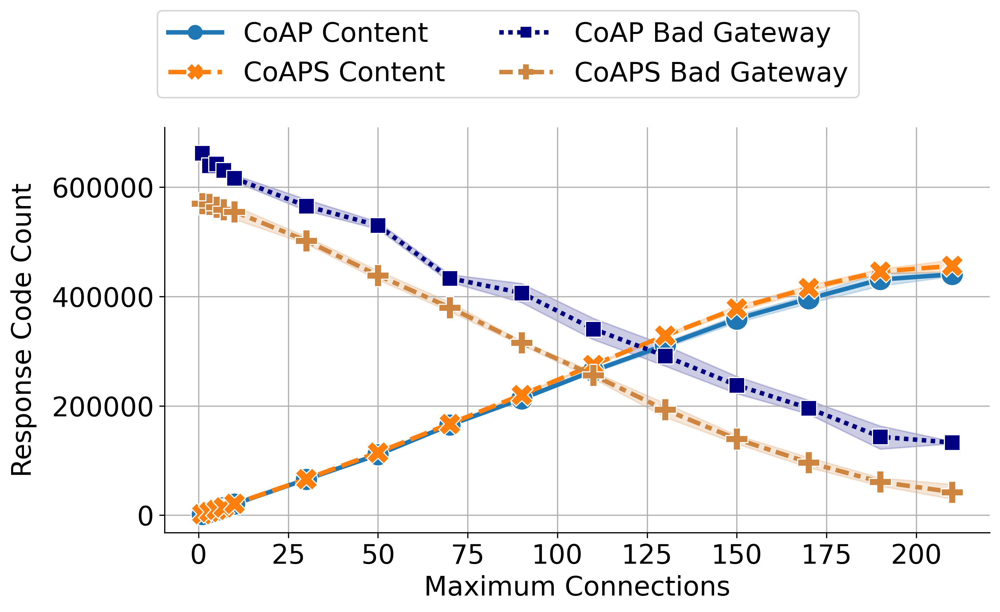

CPU times: user 3.07 s, sys: 167 ms, total: 3.24 s
Wall time: 2.93 s


,exp_id,trial,observer_id,Response Code,response_code_count,attacker_rate,server_connections,max_keep_alive_requests,num_clients,num_trials,...,num_proxy_connections,request_timeout,max_retries,keep_alive_duration,request_retry_interval,reuse_connections,Client Protocol,run_proxy_with_https,run_attacker,client_response_combo
1,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,1,attacker,Content,1811,100mbps,256,0,8,5,...,1,5,4,150,1,Reuse Connections,CoAP,True,With Attacker,CoAP Content
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,2,attacker,Content,1791,100mbps,256,0,8,5,...,1,5,4,150,1,Reuse Connections,CoAP,True,With Attacker,CoAP Content
5,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,3,attacker,Content,1761,100mbps,256,0,8,5,...,1,5,4,150,1,Reuse Connections,CoAP,True,With Attacker,CoAP Content
7,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,4,attacker,Content,1800,100mbps,256,0,8,5,...,1,5,4,150,1,Reuse Connections,CoAP,True,With Attacker,CoAP Content
9,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,5,attacker,Content,1863,100mbps,256,0,8,5,...,1,5,4,150,1,Reuse Connections,CoAP,True,With Attacker,CoAP Content
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
290,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,1,attacker,Bad Gateway,316753,100mbps,256,0,8,5,...,90,5,2,5,1,Reuse Connections,CoAPS,True,With Attacker,CoAPS Bad Gateway
292,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,2,attacker,Bad Gateway,318070,100mbps,256,0,8,5,...,90,5,2,5,1,Reuse Connections,CoAPS,True,With Attacker,CoAPS Bad Gateway
294,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,3,attacker,Bad Gateway,318642,100mbps,256,0,8,5,...,90,5,2,5,1,Reuse Connections,CoAPS,True,With Attacker,CoAPS Bad Gateway
296,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,4,attacker,Bad Gateway,318014,100mbps,256,0,8,5,...,90,5,2,5,1,Reuse Connections,CoAPS,True,With Attacker,CoAPS Bad Gateway


In [21]:
%%time

df = (
  attacker_message_df
  .replace(value_map_replacement)
  .rename(columns={
    "response_code": "Response Code",
    "run_proxy_with_dtls": "Client Protocol",
  })
)
df.sort_values(
  by=["Response Code", "Client Protocol"],
  ascending=[False, True],
  inplace=True,
)
df["client_response_combo"] = df["Client Protocol"].astype(str) + " " + df["Response Code"].astype(str)

g = sns.relplot(
  data=df,
  kind="line",
  x="num_proxy_connections",
  y="response_code_count",
  hue="client_response_combo",
  style="client_response_combo",
  markers=True,
  markersize=15,
  palette=sns.color_palette(["tab:blue", "tab:orange", "navy", "peru"]),
  aspect=2,
)

g.set_xlabels("Maximum Connections")
g.set_ylabels("Response Code Count", labelpad=10)

g.set(
  xticks=np.arange(0, 221, 25)
)

sns.move_legend(
  g,
  "upper center",
  bbox_to_anchor=(0.4, 1.18),
  ncol=2,
  title=None,
  frameon=True,
)

plt.grid(True, axis="both")
plt.show()

df

In [ ]:
_df = (
  df
  .groupby(
    by=["exp_id", "Response Code", "Client Protocol", "num_proxy_connections"]
  )
  .agg(
    response_code_count=("response_code_count", "mean")
  )
  .reset_index()
)

total_df = (
  _df
  .groupby(
    by=["exp_id", "Client Protocol"]
  )
  .agg(
    sum_response_code_count=("response_code_count", "sum")
  )
  .reset_index()
)

_df = _df.merge(total_df, on=["exp_id", "Client Protocol"], how="left")

_df["response_code_percentage"] = round(100 * _df["response_code_count"] / _df["sum_response_code_count"], 1)

_df.sort_values(by=["num_proxy_connections", "Client Protocol"])

,exp_id,Response Code,Client Protocol,num_proxy_connections,response_code_count,sum_response_code_count,response_code_percentage
0,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,Bad Gateway,CoAP,1,662659.0,664464.2,99.7
1,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,Content,CoAP,1,1805.2,664464.2,0.3
2,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_dtls_https,Bad Gateway,CoAPS,1,570221.4,572128.8,99.7
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_dtls_https,Content,CoAPS,1,1907.4,572128.8,0.3
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_3proxyconns_coap_https,Bad Gateway,CoAP,3,639663.0,645417.8,99.1
5,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_3proxyconns_coap_https,Content,CoAP,3,5754.8,645417.8,0.9
6,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_3proxyconns_dtls_https,Bad Gateway,CoAPS,3,568755.6,574765.2,99.0
7,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_3proxyconns_dtls_https,Content,CoAPS,3,6009.6,574765.2,1.0
8,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_5proxyconns_coap_https,Bad Gateway,CoAP,5,642565.2,652164.0,98.5
9,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_5proxyconns_coap_https,Content,CoAP,5,9598.8,652164.0,1.5


In [ ]:
%%time

communication_pattern_rates_sql = f"""
WITH all_patterns AS (
  SELECT
    dn.exp_id AS exp_id,
    e.trial AS trial,
    e.observe_timestamp AS observe_timestamp,
    floor(e.observe_timestamp) AS timestamp_bin,
    e.message_marker AS message_marker,
    concat(node_src.node_name, '->', node_dst.node_name) AS communication_pattern,
    m.size_bytes AS size_bytes
  FROM
    event e
    JOIN deployed_node dn ON dn.dnid = e.observer_id
    JOIN message m ON m.message_id = e.message_id
    JOIN node node_src ON node_src.node_id = m.src_id
    JOIN node node_dst ON node_dst.node_id = m.dst_id

), pattern_aggregations AS (
  SELECT
    exp_id,
    trial,
    communication_pattern,
    timestamp_bin,
    SUM(size_bytes) AS sum_bytes,
    COUNT(DISTINCT message_marker) AS num_messages
  FROM
    all_patterns
  GROUP BY
    exp_id, trial, communication_pattern, timestamp_bin
)

SELECT
  *,
  (1e-6 * sum_bytes) AS megabytes_per_second,
  (8 * 1e-6 * sum_bytes) AS megabits_per_second
FROM
  pattern_aggregations
ORDER BY
  timestamp_bin
"""

binned_messages_df = client.query_dataframe(communication_pattern_rates_sql)

binned_messages_df = binned_messages_df.merge(exp_df, on="exp_id", how="left")

binned_messages_df

CPU times: user 1.35 s, sys: 144 ms, total: 1.49 s
Wall time: 2min 3s


,exp_id,trial,communication_pattern,timestamp_bin,sum_bytes,num_messages,megabytes_per_second,megabits_per_second,attacker_rate,server_connections,...,topology_name,num_proxy_connections,request_timeout,max_retries,keep_alive_duration,request_retry_interval,reuse_connections,run_proxy_with_dtls,run_proxy_with_https,run_attacker
0,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_190proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,proxy->client7,0.0,1950,10,0.001950,0.015600,100mbps,256,...,thesis_cloud_proxy_and_internet_attacker,190,5,2,5,1,True,True,True,True
1,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_coap_https__140sec_proxy__30sec_attacker__120sec_client,3,client2->proxy,0.0,106,1,0.000106,0.000848,100mbps,256,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,False,True,True
2,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_170proxyconns_coap_https__140sec_proxy__30sec_attacker__120sec_client,5,proxy->client1,0.0,3476,11,0.003476,0.027808,100mbps,256,...,thesis_cloud_proxy_and_internet_attacker,170,5,2,5,1,True,False,True,True
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_5proxyconns_coap_https,1,client1->proxy,0.0,2550,12,0.002550,0.020400,100mbps,256,...,thesis_cloud_proxy_and_internet_attacker,5,5,4,150,1,True,False,True,True
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_3proxyconns_dtls_https,4,originserver->proxy,0.0,5916,12,0.005916,0.047328,100mbps,256,...,thesis_cloud_proxy_and_internet_attacker,3,5,4,150,1,True,True,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271006,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_70proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,1,originserver->proxy,126.0,4419,9,0.004419,0.035352,100mbps,256,...,thesis_cloud_proxy_and_internet_attacker,70,5,2,5,1,True,True,True,True
271007,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_7proxyconns_coap_https,1,proxy->client8,126.0,4108,17,0.004108,0.032864,100mbps,256,...,thesis_cloud_proxy_and_internet_attacker,7,5,4,150,1,True,False,True,True
271008,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_10proxyconns_coap_https__140sec_proxy__30sec_attacker__120sec_client,5,client8->proxy,126.0,1635,11,0.001635,0.013080,100mbps,256,...,thesis_cloud_proxy_and_internet_attacker,10,5,2,5,1,True,False,True,True
271009,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_3proxyconns_coap_https,4,originserver->proxy,126.0,4437,9,0.004437,0.035496,100mbps,256,...,thesis_cloud_proxy_and_internet_attacker,3,5,4,150,1,True,False,True,True


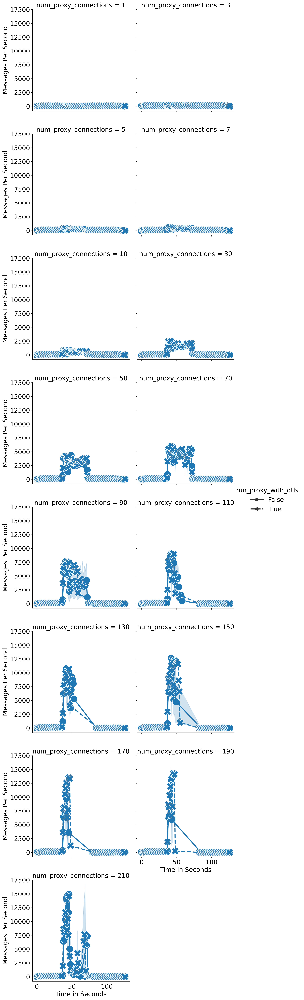

CPU times: user 1min 35s, sys: 71.9 ms, total: 1min 35s
Wall time: 1min 34s


In [ ]:
%%time

filtered_binned_messages_df = binned_messages_df[
  (binned_messages_df["communication_pattern"].str.contains("proxy->originserver"))
]

filtered_binned_messages_df

g = sns.relplot(
  data=filtered_binned_messages_df,
  kind="line",
  x="timestamp_bin",
  y="num_messages",
  style="run_proxy_with_dtls",
  col="num_proxy_connections",
  col_wrap=2,
  markers=True,
  markersize=20,
)
g.set_ylabels("Messages Per Second")
g.set_xlabels("Time in Seconds")

plt.show()

In [ ]:
filtered_binned_messages_df

,exp_id,trial,communication_pattern,timestamp_bin,sum_bytes,num_messages,megabytes_per_second,megabits_per_second,attacker_rate,server_connections,...,topology_name,num_proxy_connections,request_timeout,max_retries,keep_alive_duration,request_retry_interval,reuse_connections,run_proxy_with_dtls,run_proxy_with_https,run_attacker
8,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_70proxyconns_coap_https__140sec_proxy__30sec_attacker__120sec_client,1,proxy->originserver,0.0,2763,12,0.002763,0.022104,100mbps,256,...,thesis_cloud_proxy_and_internet_attacker,70,5,2,5,1,True,False,True,True
11,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_90proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,proxy->originserver,0.0,2763,12,0.002763,0.022104,100mbps,256,...,thesis_cloud_proxy_and_internet_attacker,90,5,2,5,1,True,True,True,True
21,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_50proxyconns_coap_https__140sec_proxy__30sec_attacker__120sec_client,2,proxy->originserver,0.0,2993,13,0.002993,0.023944,100mbps,256,...,thesis_cloud_proxy_and_internet_attacker,50,5,2,5,1,True,False,True,True
39,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_150proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,2,proxy->originserver,0.0,3224,14,0.003224,0.025792,100mbps,256,...,thesis_cloud_proxy_and_internet_attacker,150,5,2,5,1,True,True,True,True
42,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_150proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,1,proxy->originserver,0.0,2994,13,0.002994,0.023952,100mbps,256,...,thesis_cloud_proxy_and_internet_attacker,150,5,2,5,1,True,True,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
270990,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_30proxyconns_coap_https__140sec_proxy__30sec_attacker__120sec_client,1,proxy->originserver,126.0,3262,14,0.003262,0.026096,100mbps,256,...,thesis_cloud_proxy_and_internet_attacker,30,5,2,5,1,True,False,True,True
270994,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_5proxyconns_coap_https,1,proxy->originserver,126.0,3262,14,0.003262,0.026096,100mbps,256,...,thesis_cloud_proxy_and_internet_attacker,5,5,4,150,1,True,False,True,True
270995,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_10proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,proxy->originserver,126.0,1864,8,0.001864,0.014912,100mbps,256,...,thesis_cloud_proxy_and_internet_attacker,10,5,2,5,1,True,True,True,True
271002,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_70proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,1,proxy->originserver,126.0,2097,9,0.002097,0.016776,100mbps,256,...,thesis_cloud_proxy_and_internet_attacker,70,5,2,5,1,True,True,True,True


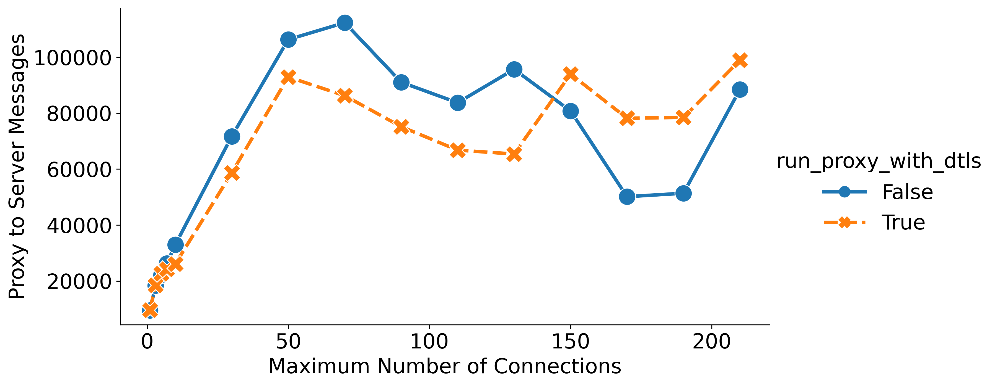

,exp_id,num_trials,num_proxy_connections,run_proxy_with_dtls,num_messages
0,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_coap_https,5,1,False,9487.2
1,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_1proxyconns_dtls_https,5,1,True,9574.2
2,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_3proxyconns_coap_https,5,3,False,18346.0
3,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_3proxyconns_dtls_https,5,3,True,18476.4
4,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_5proxyconns_coap_https,5,5,False,22221.4
5,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_5proxyconns_dtls_https,5,5,True,22672.0
6,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_7proxyconns_coap_https,5,7,False,26283.6
7,thesis_group_controlling_proxy_heap_size_8clients_withattacker_8000MBheap_7proxyconns_dtls_https,5,7,True,24179.8
8,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_10proxyconns_coap_https__140sec_proxy__30sec_attacker__120sec_client,5,10,False,32989.4
9,thesis_group_controlling_proxy_rtt_8clients_withattacker_8000MBheap_10proxyconns_dtls_https__140sec_proxy__30sec_attacker__120sec_client,5,10,True,26089.8


In [ ]:
df = (
  filtered_binned_messages_df
  .groupby(
    by=["exp_id", "trial", "num_trials", "num_proxy_connections", "run_proxy_with_dtls"]
  )
  .agg(
    num_messages=("num_messages", "sum")
  )
  .reset_index()
  .groupby(
    by=["exp_id", "num_trials", "num_proxy_connections", "run_proxy_with_dtls"]
  )
  .agg(
    num_messages=("num_messages", "mean")
  )
  .reset_index()
)

g = sns.relplot(
  data=df,
  kind="line",
  x="num_proxy_connections",
  y="num_messages",
  style="run_proxy_with_dtls",
  hue="run_proxy_with_dtls",
  markers=True,
  markersize=15,
  aspect=2,
)
g.set_ylabels("Proxy to Server Messages")
g.set_xlabels("Maximum Number of Connections")

plt.show()

df